In [ ]:
!pip install pyspark


In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, to_timestamp, hour, dayofweek, month, year, count, to_date
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
# !unzip "/content/drive/MyDrive/4_usa_city_crime_data-20241212T183644Z-001.zip" -d "/content/drive/MyDrive/4_usa_city_crime_data/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
spark = SparkSession.builder.appName("CrimeAnalysis").getOrCreate()

folder_path = "/content/drive/MyDrive/4_usa_city_crime_data/4_usa_city_crime_data/"

data = spark.read.csv(folder_path, header=True, inferSchema=True)

data.printSchema()

data = data.withColumn("date_occured", to_date(col("date_occured"), "dd.MM.yyyy")) \
           .withColumn("date_report", to_date(col("date_report"), "dd.MM.yyyy"))

data.show(15)
unique_cities = data.select("city").distinct()

unique_cities.show()

root
 |-- city: string (nullable = true)
 |-- date_occured: string (nullable = true)
 |-- time_occured: timestamp (nullable = true)
 |-- date_report: string (nullable = true)
 |-- time_report: timestamp (nullable = true)
 |-- crime_category: string (nullable = true)
 |-- crime_description: string (nullable = true)
 |-- latitude: double (nullable = true)
 |-- longitude: double (nullable = true)
 |-- address: string (nullable = true)
 |-- location_type: string (nullable = true)
 |-- investigation_status: string (nullable = true)
 |-- victim_age_group: string (nullable = true)
 |-- victim_sex: string (nullable = true)
 |-- victim_race: string (nullable = true)
 |-- suspect_age_group: string (nullable = true)
 |-- suspect_sex: string (nullable = true)
 |-- suspect_race: string (nullable = true)
 |-- police_station: string (nullable = true)

+--------+------------+-------------------+-----------+-----------+--------------+--------------------+-----------+------------+-------+---------------

In [ ]:
data.groupBy("victim_age_group").count().show()

+----------------+-------+
|victim_age_group|  count|
+----------------+-------+
|             <18| 106458|
|           25-44|1215610|
|            NULL|1953000|
|             65+| 170218|
|           18-24| 293833|
|           45-64| 639465|
+----------------+-------+



# Time between crime occured and crime was reported

In [ ]:
from pyspark.sql.functions import col, to_date, datediff, avg
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd



data = data.withColumn("response_time_days", datediff(col("date_report"), col("date_occured")))

data.select("date_occured", "date_report", "response_time_days").show(10)

response_summary = data.groupBy("crime_category").agg(avg("response_time_days").alias("avg_response_time"))
response_summary.show()

response_summary_pd = response_summary.toPandas()




+------------+-----------+------------------+
|date_occured|date_report|response_time_days|
+------------+-----------+------------------+
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
|  2020-01-01| 2020-01-01|                 0|
+------------+-----------+------------------+
only showing top 10 rows

+--------------------+-------------------+
|      crime_category|  avg_response_time|
+--------------------+-------------------+
|                NULL|   3.80053576876144|
|               FRAUD|  49.44056964573269|
|             SUICIDE|0.39776951672862454|
|      MISSING PERSON|  19.39346590909091|
|FORGERY AND COUNT...|  36.22

<ipython-input-36-cb8c35d7c9d0>:5: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


<ipython-input-36-cb8c35d7c9d0>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




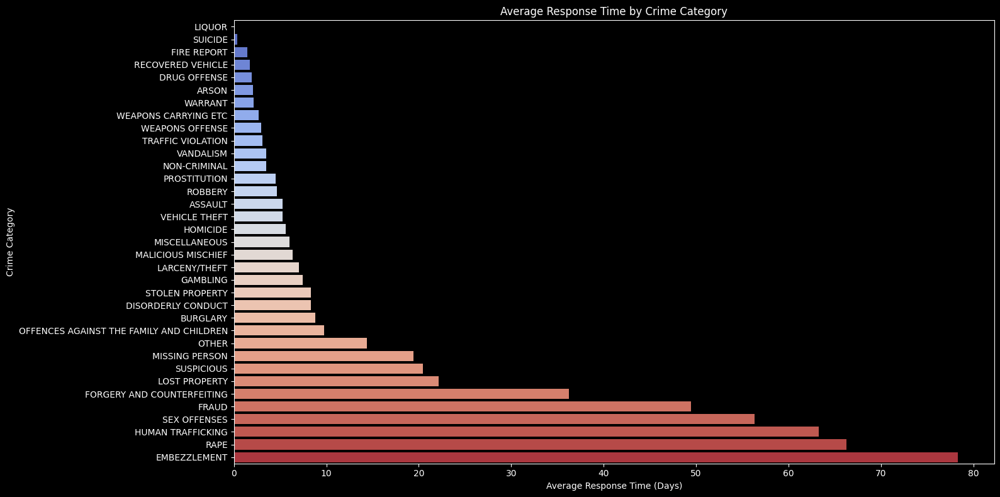

In [ ]:
response_summary_filtered = response_summary_pd[response_summary_pd['avg_response_time'] > 0].sort_values(by="avg_response_time", ascending=True, inplace=False)
plt.style.use('dark_background')

plt.figure(figsize=(16, 8))
sns.barplot(x="avg_response_time", y="crime_category", data=response_summary_filtered, palette="coolwarm", ci=None)

plt.title("Average Response Time by Crime Category")
plt.xlabel("Average Response Time (Days)")
plt.ylabel("Crime Category")
plt.tight_layout()
plt.show()


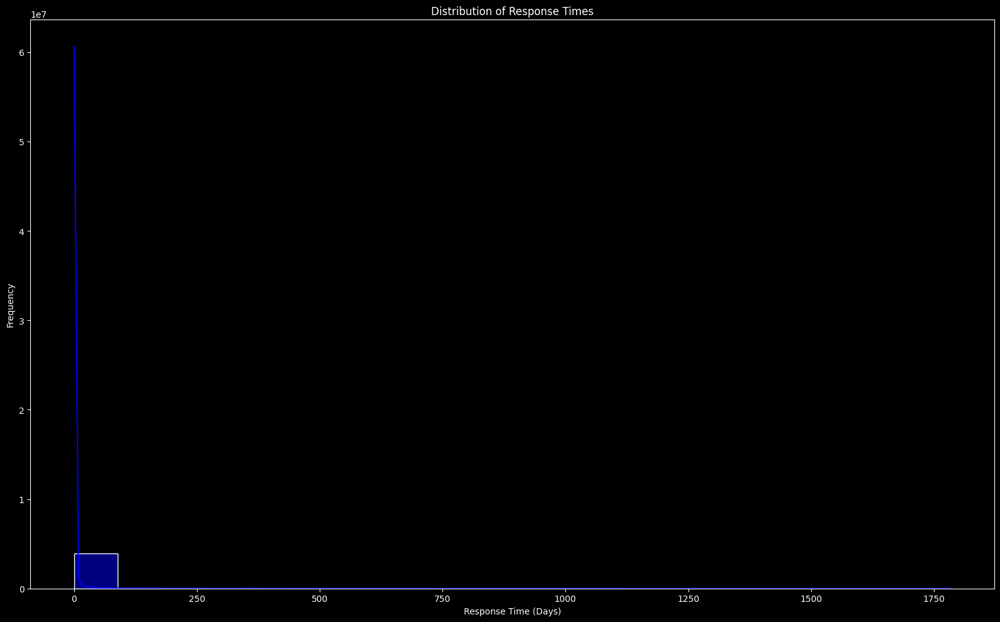

In [ ]:
response_times_pd = data.select("response_time_days").toPandas()

plt.figure(figsize=(16, 10))
sns.histplot(response_times_pd["response_time_days"].dropna(), kde=True, bins=20, color='blue')
plt.title("Distribution of Response Times")
plt.xlabel("Response Time (Days)")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Crime by age of victim

In [ ]:
# data["victim_age_group"]
demographics = data.groupBy("victim_age_group")
demographics_count = demographics.count()
# demographics_count.show()
first_5_categories = demographics_count.filter(
    demographics_count['victim_age_group'].isin('<18', '18-24', '25-44', '45-64', '65+')
)


first_5_categories.show()

from pyspark.sql.functions import when

ordered_categories = first_5_categories.withColumn(
    "sort_key",
    when(first_5_categories['victim_age_group'] == '<18', 1)
    .when(first_5_categories['victim_age_group'] == '18-24', 2)
    .when(first_5_categories['victim_age_group'] == '25-44', 3)
    .when(first_5_categories['victim_age_group'] == '45-64', 4)
    .when(first_5_categories['victim_age_group'] == '65+', 5)
)

ordered_categories = ordered_categories.orderBy("sort_key").drop("sort_key")

ordered_categories.show()
demographics_pd = ordered_categories.toPandas()


+----------------+-------+
|victim_age_group|  count|
+----------------+-------+
|             <18| 106458|
|           25-44|1215610|
|             65+| 170218|
|           18-24| 293833|
|           45-64| 639465|
+----------------+-------+

+----------------+-------+
|victim_age_group|  count|
+----------------+-------+
|             <18| 106458|
|           18-24| 293833|
|           25-44|1215610|
|           45-64| 639465|
|             65+| 170218|
+----------------+-------+



<ipython-input-47-bbba5306582f>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(


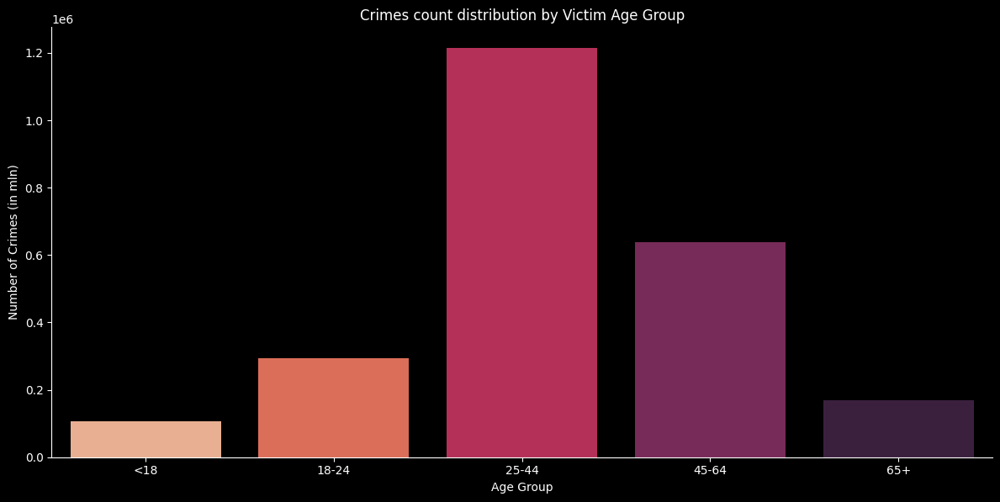

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


sns.catplot(
    x="victim_age_group",
    y="count",
    data=demographics_pd,
    kind="bar",
    height=6,
    aspect=2,
    palette="rocket_r"
)
plt.title("Crimes count distribution by Victim Age Group")
plt.xlabel("Age Group")
plt.ylabel("Number of Crimes (in mln)")
plt.show()


# Geographical

In [ ]:
import folium
from folium.plugins import HeatMap

geo_data = data.select("latitude", "longitude").dropna()
geo_data_pd = geo_data.toPandas()
base_map = folium.Map(location=[geo_data_pd["latitude"].mean(), geo_data_pd["longitude"].mean()], zoom_start=12)
HeatMap(data=geo_data_pd[["latitude", "longitude"]].values, radius=10).add_to(base_map)
base_map.save("crime_heatmap.html")


In [ ]:
# base_map


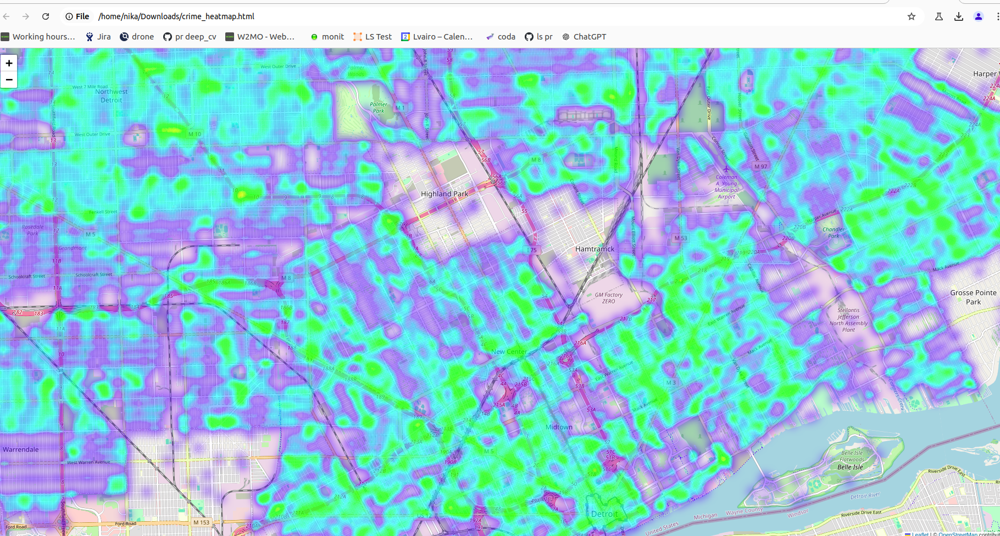

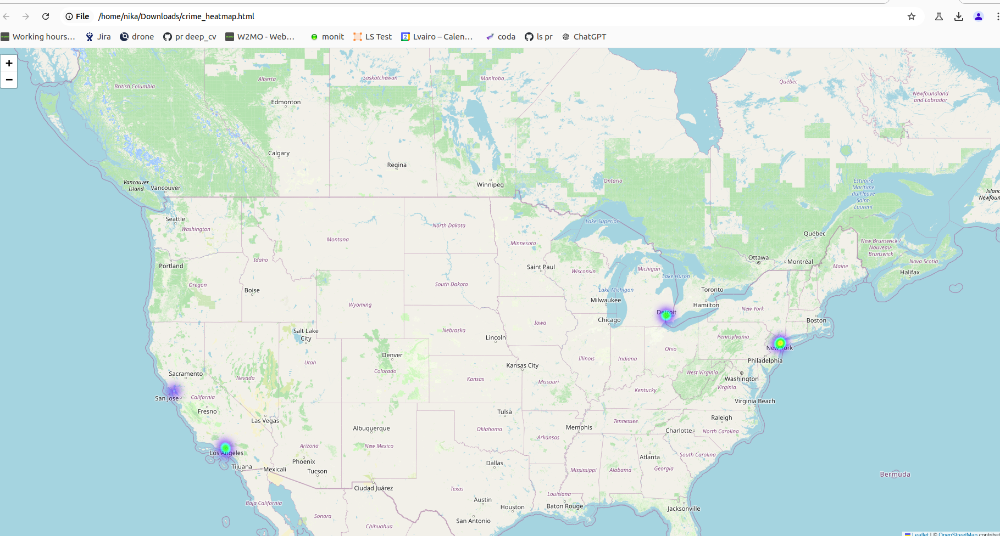

New York
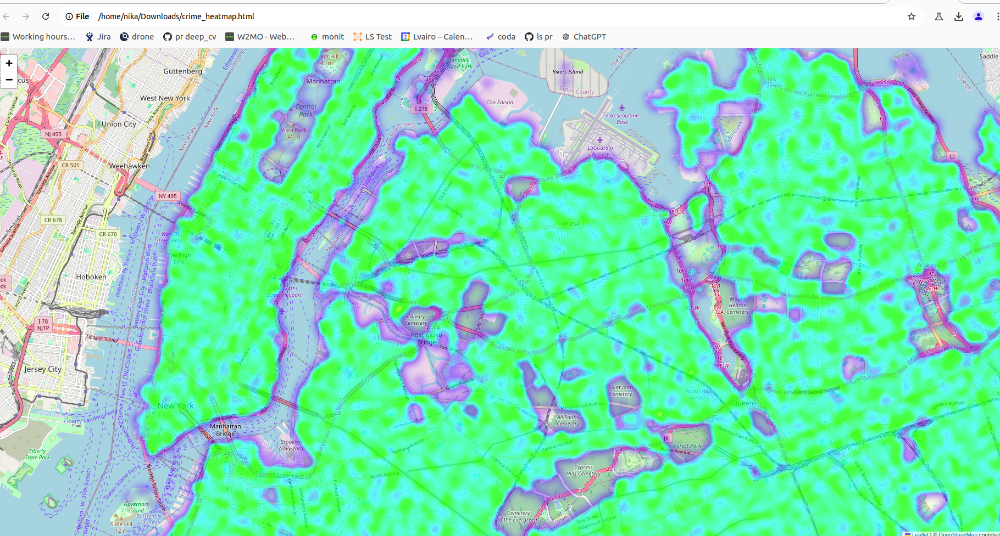

# Crime category

In [ ]:
from pyspark.sql.functions import col

filtered_data = data.filter(col('crime_category').isNotNull() & (col('crime_category') != 'none'))
category_count = filtered_data.groupBy("crime_category").count().orderBy(col("count").desc())
category_count.show()
category_count_pd = category_count.toPandas()





+------------------+------+
|    crime_category| count|
+------------------+------+
|     LARCENY/THEFT|229433|
|           ASSAULT|158557|
|     VEHICLE THEFT| 78165|
|          BURGLARY| 62999|
|DAMAGE TO PROPERTY| 56787|
|             FRAUD| 52940|
|     MISCELLANEOUS| 48499|
|MALICIOUS MISCHIEF| 43745|
|      NON-CRIMINAL| 34272|
| RECOVERED VEHICLE| 28407|
|   WEAPONS OFFENSE| 24502|
|      DRUG OFFENSE| 21230|
|           ROBBERY| 20671|
|             OTHER| 17413|
|           WARRANT| 16273|
|   STOLEN PROPERTY| 15515|
|     LOST PROPERTY| 15315|
|        SUSPICIOUS| 13193|
|    MISSING PERSON| 12672|
|       OBSTRUCTION| 12094|
+------------------+------+
only showing top 20 rows



<ipython-input-42-d2d8f576be8b>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




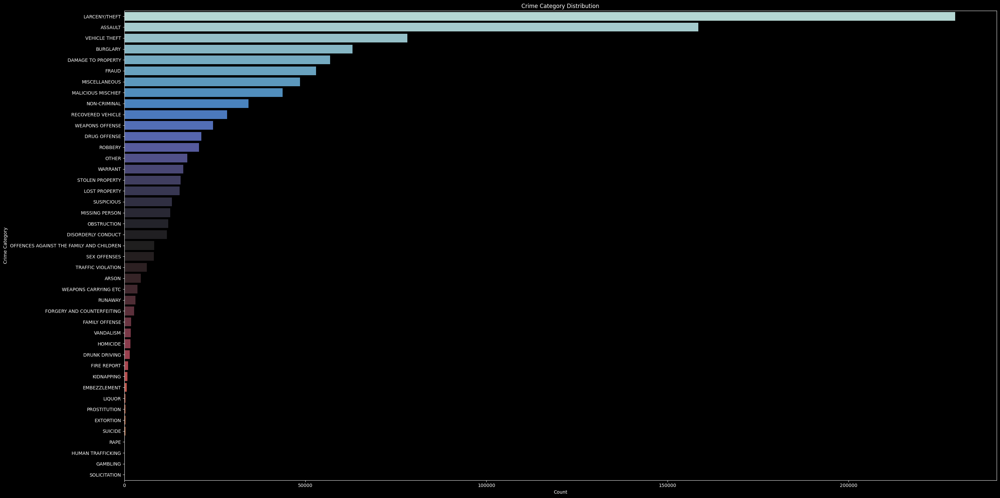

In [ ]:
plt.figure(figsize=(30, 15))
sns.barplot(x='count', y='crime_category', data=category_count_pd, palette='icefire')
plt.title("Crime Category Distribution")
plt.xlabel("Count")
plt.ylabel("Crime Category")
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px

# Ensure you have already converted Spark DataFrame to Pandas DataFrame
# category_count_pd = category_count.toPandas()

# Create a treemap plot
fig = px.treemap(
    category_count_pd,
    path=['crime_category'],  # Hierarchy: only one level here
    values='count',          # Size of the boxes based on the count
    color='count',           # Color intensity based on count
    color_continuous_scale='Reds',  # Use a visually engaging color scale
    title="Crime Category Distribution"
)

# Update layout for better readability
fig.update_layout(
    paper_bgcolor='black',  # Background color outside the plot
    plot_bgcolor='black',
    title=dict(
        text="Crime Category Distribution",
        font=dict(color='white'),  # Set title font color to white
    ),
    font=dict(color='white'),
    title_font_size=24,
    title_x=0.5,  # Center-align the title
    margin=dict(t=50, l=25, r=25, b=25)  # Reduce white space around the chart
)

# Show the plot
fig.show()


In [ ]:
# filtered_data = data.filter(col("location_type").isNotNull() & (col("location_type") != "none"))
filtered = data.filter(col('crime_category').isNotNull() & (col('crime_category') != 'none'))
category_location = filtered.groupBy("date_occured", "crime_category").count()
category_location.show()
category_location_pd = category_location.toPandas()


+------------+------------------+-----+
|date_occured|    crime_category|count|
+------------+------------------+-----+
|  2023-01-09|     LOST PROPERTY|    8|
|  2021-09-20|     LARCENY/THEFT|  146|
|  2021-07-06|     LARCENY/THEFT|  156|
|  2021-12-06|     LARCENY/THEFT|  174|
|  2021-09-28|     LARCENY/THEFT|  137|
|  2021-09-30|           ASSAULT|   90|
|  2022-01-24|     LARCENY/THEFT|  126|
|  2022-02-06| RECOVERED VEHICLE|   14|
|  2022-05-20|     LARCENY/THEFT|  145|
|  2022-09-13|           ASSAULT|   88|
|  2023-02-06|        SUSPICIOUS|    5|
|  2022-10-18|        SUSPICIOUS|   10|
|  2023-09-23|     MISCELLANEOUS|   38|
|  2024-04-11|        SUSPICIOUS|    5|
|  2023-01-20|MALICIOUS MISCHIEF|   23|
|  2023-09-22|MALICIOUS MISCHIEF|   34|
|  2023-07-09|      DRUG OFFENSE|    7|
|  2023-04-03|   STOLEN PROPERTY|   13|
|  2024-04-20|           ROBBERY|   11|
|  2023-04-14|   WEAPONS OFFENSE|   14|
+------------+------------------+-----+
only showing top 20 rows



In [ ]:
import plotly.express as px

fig = px.bar(
    category_location_pd,
    x='count',
    y='crime_category',
    color='crime_category',
    hover_data=['date_occured'],
    title="Crime Category Distribution",
    labels={"count": "Count", "crime_category": "Crime Category"}
)
fig.update_layout(height=1200, width=1200,  plot_bgcolor="white" )
fig.show()


In [ ]:
filtered_data = data.filter(
    col('victim_race').isNotNull() & (col('victim_race') != 'none')
)
filtered_data = filtered_data.filter(col('victim_race') != 'OTHER')
filtered_data = filtered_data.filter(col('victim_race') != 'AMERICAN INDIAN/ALASKAN NATIVE')
filtered_data = filtered_data.filter(col('victim_race') != 'UNKNOWN')
race_count = filtered_data.groupBy("victim_race") \
                               .agg(count("*").alias("count")) \
                               .orderBy(col("count").desc())
race_count = race_count.filter(col("count") >= 1000)
race_count.show()
race_count_pd = race_count.toPandas()


+--------------------+------+
|         victim_race| count|
+--------------------+------+
|      WHITE HISPANIC|601294|
|               BLACK|574949|
|               WHITE|426233|
|ASIAN / PACIFIC I...|168026|
|      BLACK HISPANIC| 72792|
+--------------------+------+



<ipython-input-47-1928e5077e61>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




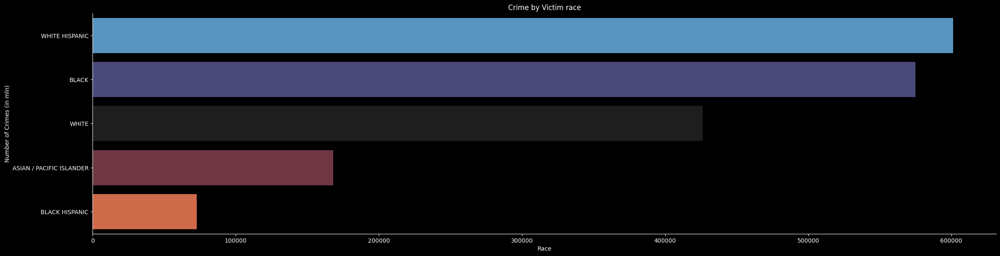

In [ ]:
sns.catplot(x="count", y="victim_race", data=race_count_pd, kind="bar", height=6, aspect=4, palette="icefire")
plt.title("Crime by Victim race")
plt.xlabel("Race")
plt.ylabel("Number of Crimes (in mln)")
plt.show()

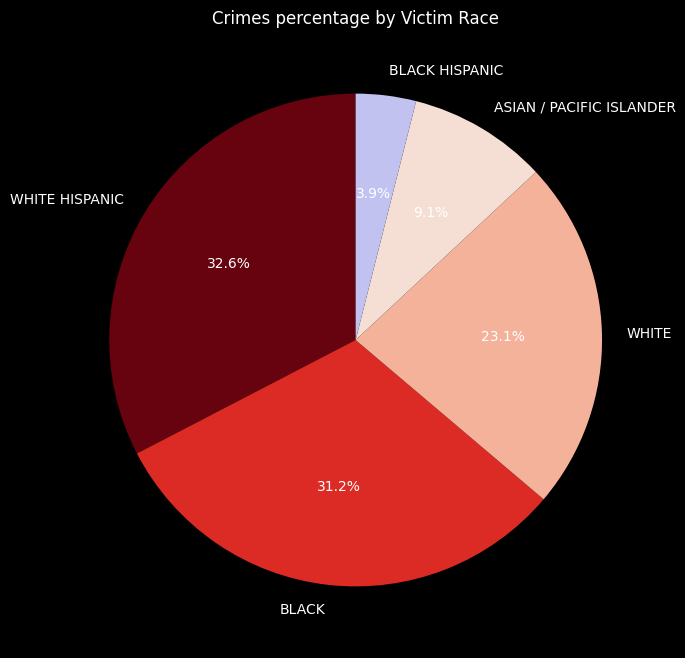

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')
labels = race_count_pd["victim_race"]
sizes = race_count_pd["count"]

custom_colors = ['#67030f', '#dc2b25', '#f5b29a', '#f5dfd4', '#c2c2f0']

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=custom_colors)

plt.title("Crimes percentage by Victim Race")

plt.show()


In [ ]:
filtered_data = data.filter(
    col('victim_sex').isNotNull() & (col('victim_sex') != 'none')
)
filtered_data = filtered_data.filter(col('victim_sex') != 'None')

sex_count = filtered_data.groupBy("victim_sex") \
                               .agg(count("*").alias("count")) \
                               .orderBy(col("count").desc())

sex_count.show()
sex_count_pd = sex_count.toPandas()

+----------+-------+
|victim_sex|  count|
+----------+-------+
|         F|1260015|
|         M|1222459|
+----------+-------+



<ipython-input-50-a4d0b93c8f5f>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




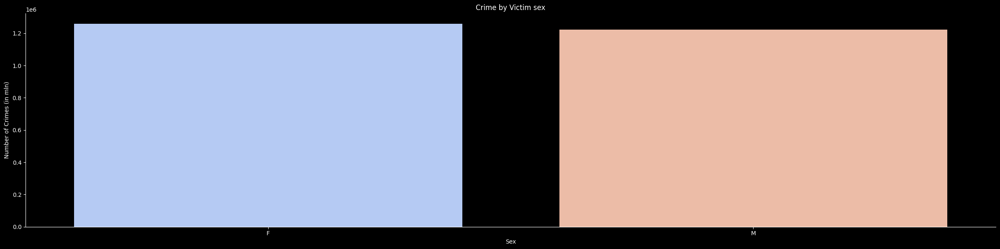

In [ ]:
sns.catplot(x="victim_sex", y="count", data=sex_count_pd, kind="bar", height=6, aspect=4, palette="coolwarm")
plt.title("Crime by Victim sex")
plt.xlabel("Sex")
plt.ylabel("Number of Crimes (in mln)")
plt.show()

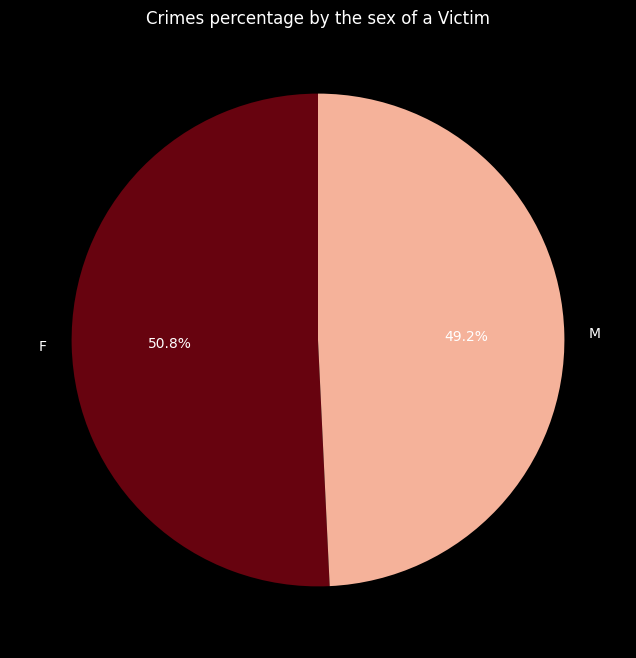

In [ ]:
import matplotlib.pyplot as plt

labels = sex_count_pd["victim_sex"]
sizes = sex_count_pd["count"]

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#67030f', '#f5b29a'])

plt.title("Crimes percentage by the sex of a Victim")

plt.show()


# Hypothesis

In [ ]:
from pyspark.sql.functions import hour, when, count
from scipy.stats import chi2_contingency

def test_crime_vs_time(data):
    data = data.withColumn("hour", hour("time_occured"))

    data = data.withColumn(
        "time_of_day",
        when((col("hour") >= 0) & (col("hour") < 6), "Night")
        .when((col("hour") >= 6) & (col("hour") < 12), "Morning")
        .when((col("hour") >= 12) & (col("hour") < 18), "Afternoon")
        .otherwise("Evening")
    )

    contingency_df = (
        data.groupBy("crime_category", "time_of_day")
        .agg(count("*").alias("count"))
        .toPandas()
    )
    contingency_table = contingency_df.pivot(index="crime_category", columns="time_of_day", values="count").fillna(0)

    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print("Chi-Square Test for Crime Categories vs. Time of Day")
    print(f"Chi2: {chi2}, p-value: {p}")
    if p < 0.05:
        print("Reject the null hypothesis: Crime occurrence depends on time of day.")
    else:
        print("Fail to reject the null hypothesis: Crime occurrence is independent of time of day.")

test_crime_vs_time(data)


Chi-Square Test for Crime Categories vs. Time of Day
Chi2: 87251.36008609788, p-value: 0.0
Reject the null hypothesis: Crime occurrence depends on time of day.


A Cramer's V value of 0.1153 indicates a weak association between the time of occurrence and crime categories.

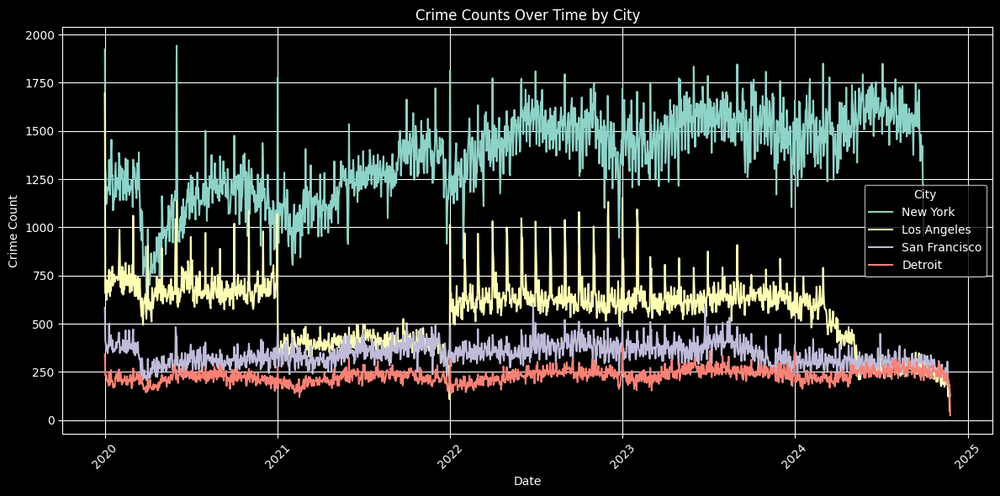

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('dark_background')
filtered = data.filter(col('city').isNotNull() & col('date_occured').isNotNull())

category_location = filtered.groupBy("date_occured", "city").count()

category_location_pd = category_location.toPandas()

category_location_pd['date_occured'] = pd.to_datetime(category_location_pd['date_occured'])

cities = category_location_pd['city'].unique()
plt.figure(figsize=(12, 6))

for city in cities:
    city_data = category_location_pd[category_location_pd['city'] == city]
    city_data_grouped = city_data.groupby('date_occured').sum()

    plt.plot(city_data_grouped.index, city_data_grouped['count'], label=city)

plt.title('Crime Counts Over Time by City')
plt.xlabel('Date')
plt.ylabel('Crime Count')
plt.legend(title='City')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


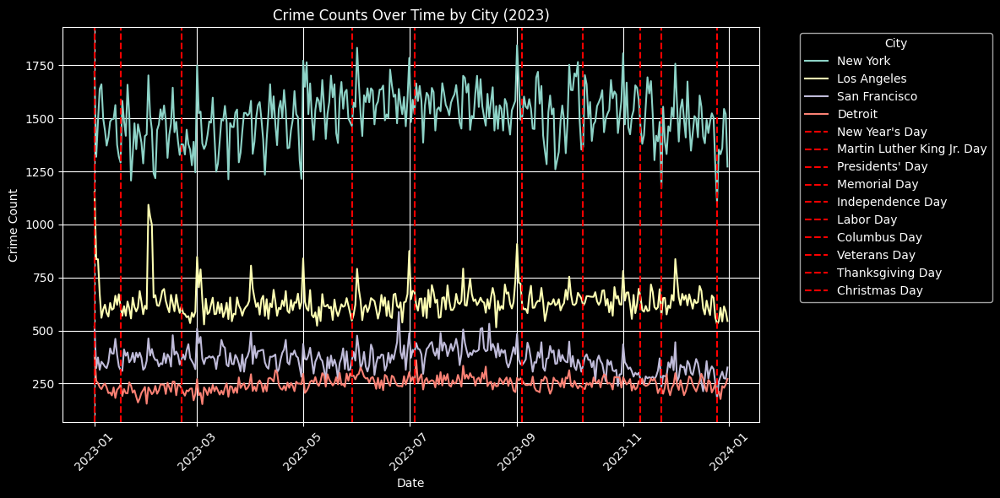

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

filtered = data.filter(col('city').isNotNull() & col('date_occured').isNotNull())

category_location = filtered.groupBy("date_occured", "city").count()

category_location_pd = category_location.toPandas()

category_location_pd['date_occured'] = pd.to_datetime(category_location_pd['date_occured'])

category_location_pd_2023 = category_location_pd[category_location_pd['date_occured'].dt.year == 2023]

cities = category_location_pd_2023['city'].unique()

plt.figure(figsize=(12, 6))

for city in cities:
    city_data = category_location_pd_2023[category_location_pd_2023['city'] == city]
    city_data_grouped = city_data.groupby('date_occured').sum()

    plt.plot(city_data_grouped.index, city_data_grouped['count'], label=city)
holidays_2023 = {
    'New Year\'s Day': '2023-01-01',
    'Martin Luther King Jr. Day': '2023-01-16',
    'Presidents\' Day': '2023-02-20',
    'Memorial Day': '2023-05-29',
    'Independence Day': '2023-07-04',
    'Labor Day': '2023-09-04',
    'Columbus Day': '2023-10-09',
    'Veterans Day': '2023-11-11',
    'Thanksgiving Day': '2023-11-23',
    'Christmas Day': '2023-12-25'
}

for holiday, date in holidays_2023.items():
    plt.axvline(pd.to_datetime(date), color='r', linestyle='--', label=holiday)

plt.title('Crime Counts Over Time by City (2023)')
plt.xlabel('Date')
plt.ylabel('Crime Count')
plt.legend(title='City', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

City: New York, Holiday: Martin Luther King Jr. Day, year: 2020 p-value: 0.031746031746031744
  => There was a significant change in crime rate around Martin Luther King Jr. Day
6550 5741
City: New York, Holiday: Veterans Day, year: 2020 p-value: 0.03614514204656228
  => There was a significant change in crime rate around Veterans Day
6068 5690
City: Los Angeles, Holiday: Independence Day, year: 2020 p-value: 0.015873015873015872
  => There was a significant change in crime rate around Independence Day
3984 3191
City: San Francisco, Holiday: Memorial Day, year: 2020 p-value: 0.021176657854316622
  => There was a significant change in crime rate around Memorial Day
1421 1968
City: Detroit, Holiday: Memorial Day, year: 2020 p-value: 0.031746031746031744
  => There was a significant change in crime rate around Memorial Day
1332 1139
City: Los Angeles, Holiday: New Year's Day, year: 2021 p-value: 0.007936507936507936
  => There was a significant change in crime rate around New Year's Day
3

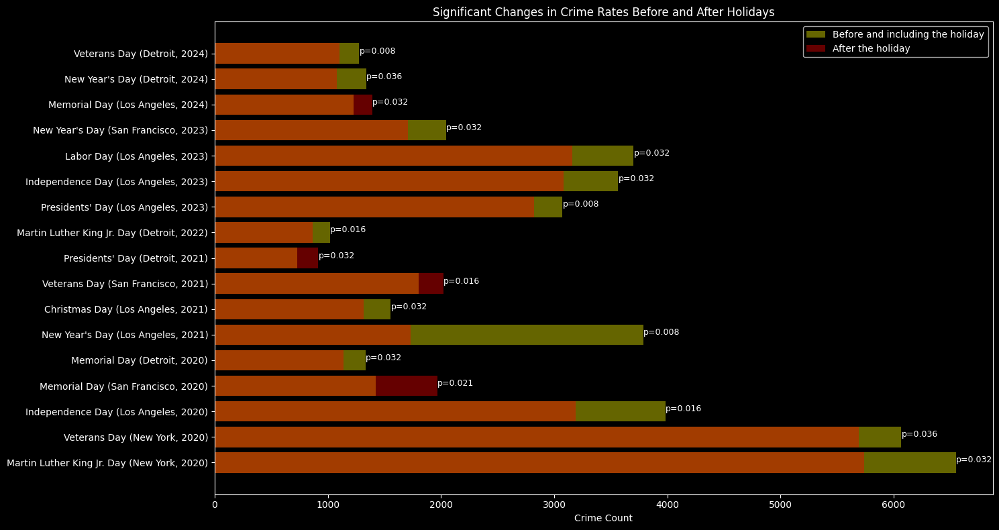

In [ ]:
from scipy.stats import mannwhitneyu
import pandas as pd
import matplotlib.pyplot as plt

def test_rapid_growth(city_data, holiday_date, window_before=4, window_after=4):
    holiday_date = pd.to_datetime(holiday_date)
    before_period = city_data[(city_data['date_occured'] >= holiday_date - pd.Timedelta(days=window_before)) &
                              (city_data['date_occured'] <= holiday_date)]

    after_period = city_data[(city_data['date_occured'] > holiday_date) &
                             (city_data['date_occured'] <= holiday_date + pd.Timedelta(days=window_after + 1))]

    # print(after_period, holiday_date)
    before_crime_count = before_period['count'].sum()
    after_crime_count = after_period['count'].sum()

    if before_period.empty:
        print(f"No crimes recorded in the period before {holiday_date} (Window: {window_before} days).")
        return "", "", before_crime_count, after_crime_count
    if after_period.empty:
        print(f"No crimes recorded in the period after {holiday_date} (Window: {window_after} days).")
        return "", "", before_crime_count, after_crime_count
    u_stat, p_value = mannwhitneyu(before_period['count'], after_period['count'])
    return u_stat, p_value, before_crime_count, after_crime_count

cities = category_location_pd['city'].unique()
years = [2020, 2021, 2022, 2023, 2024]

results = []

for year in years:
    holidays = {
        'New Year\'s Day': f'{year}-01-01',
        'Martin Luther King Jr. Day': f'{year}-01-16',
        'Presidents\' Day': f'{year}-02-20',
        'Memorial Day': f'{year}-05-29',
        'Independence Day': f'{year}-07-04',
        'Labor Day': f'{year}-09-04',
        'Columbus Day': f'{year}-10-09',
        'Veterans Day': f'{year}-11-11',
        'Thanksgiving Day': f'{year}-11-23',
        'Christmas Day': f'{year}-12-25'
    }

    for city in cities:
        city_data = category_location_pd[category_location_pd['city'] == city]

        for holiday_name, holiday_date in holidays.items():
            t_stat, p_value, before_crime_count, after_crime_count = test_rapid_growth(city_data, holiday_date)

            if p_value != "" and p_value < 0.05:
                print(f"City: {city}, Holiday: {holiday_name}, year: {year} p-value: {p_value}")
                print(f"  => There was a significant change in crime rate around {holiday_name}")
                print(before_crime_count, after_crime_count)

                results.append({
                    'City': city,
                    'Holiday': holiday_name,
                    'Year': year,
                    'Before Crime Count': before_crime_count,
                    'After Crime Count': after_crime_count,
                    'p-value': p_value
                })

results_df = pd.DataFrame(results)

if not results_df.empty:
    fig, ax = plt.subplots(figsize=(15, 8))

    for i, row in results_df.iterrows():
        ax.barh(f"{row['Holiday']} ({row['City']}, {row['Year']})",
                [row['Before Crime Count'], row['After Crime Count']],
                color=['yellow', 'red'], alpha=0.4, label=['Before', 'After'] if i == 0 else None)

    ax.set_xlabel("Crime Count")
    ax.set_title("Significant Changes in Crime Rates Before and After Holidays")
    ax.legend(["Before and including the holiday", "After the holiday"], loc="upper right")

    for i, row in results_df.iterrows():
        ax.text(max(row['Before Crime Count'], row['After Crime Count']) + 2, i,
                f"p={row['p-value']:.3f}", color='white', fontsize=9)

    plt.tight_layout()
    plt.show()


In [ ]:
from scipy.stats import mannwhitneyu
import pandas as pd

def test_crime_change(city_data, target_date, window_before=3, window_after=4):
    """
    Test for significant change in crime rate around a target date.

    Parameters:
        city_data (DataFrame): Data for a specific city containing 'date_occured' and 'count'.
        target_date (str): Date to check for changes around.
        window_before (int): Number of days before the target date to include in analysis.
        window_after (int): Number of days after the target date to include in analysis.

    Returns:
        tuple: (u_stat, p_value) if both periods have data; otherwise None.
    """
    target_date = pd.to_datetime(target_date)

    before_period = city_data[(city_data['date_occured'] >= target_date - pd.Timedelta(days=window_before)) &
                              (city_data['date_occured'] < target_date)]
    after_period = city_data[(city_data['date_occured'] > target_date) &
                             (city_data['date_occured'] <= target_date + pd.Timedelta(days=window_after))]

    if before_period.empty or after_period.empty:
        return None

    u_stat, p_value = mannwhitneyu(before_period['count'], after_period['count'], alternative='two-sided')
    return u_stat, p_value

cities = category_location_pd['city'].unique()
unique_dates = category_location_pd['date_occured'].unique()

for city in cities:
    city_data = category_location_pd[category_location_pd['city'] == city]

    for target_date in unique_dates:
        result = test_crime_change(city_data, target_date)

        if result is not None:
            u_stat, p_value = result

            if p_value < 0.05:
                print(f"City: {city}, Date: {target_date}, p-value: {p_value:.4f}")
                print("  => Significant change in crime rate detected.")


City: New York, Date: 2021-08-10 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: New York, Date: 2020-04-06 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: New York, Date: 2021-08-06 00:00:00, p-value: 0.0436
  => Significant change in crime rate detected.
City: New York, Date: 2024-02-17 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: New York, Date: 2021-08-11 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: New York, Date: 2020-05-27 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: New York, Date: 2021-03-12 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: New York, Date: 2021-01-05 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: New York, Date: 2022-01-27 00:00:00, p-value: 0.0497
  => Significant change in crime rate detected.
City: Los Angeles, Date: 2024-06-15 0